<a href="https://colab.research.google.com/github/Harini-que/Care_Buddy/blob/main/BIOMET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python mediapipe

In [ ]:
!pip install numpy


In [ ]:
!pip install matplotlib

In [ ]:
import matplotlib.pyplot as plt

No user database found. Starting fresh.
Enter your name for enrollment/authentication: Harini
Capture authentication image 1/5


<IPython.core.display.Javascript object>

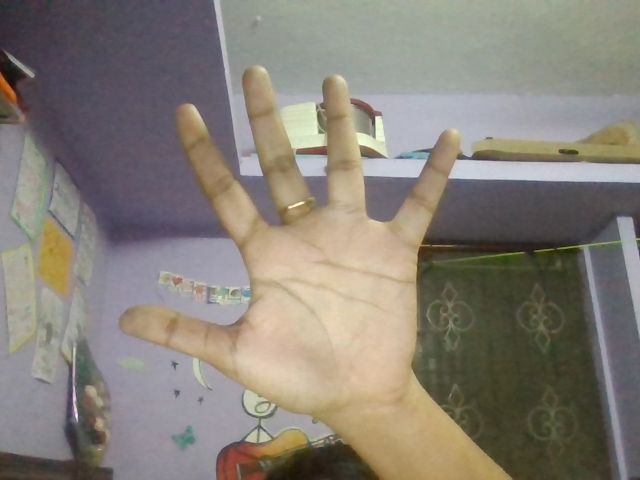

Capture authentication image 2/5


<IPython.core.display.Javascript object>

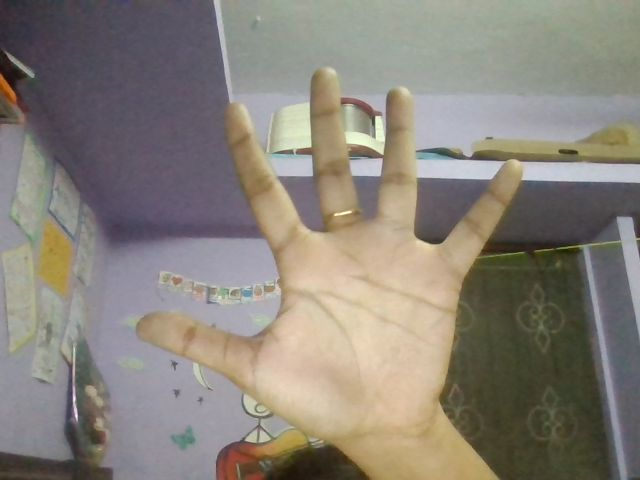

Capture authentication image 3/5


<IPython.core.display.Javascript object>

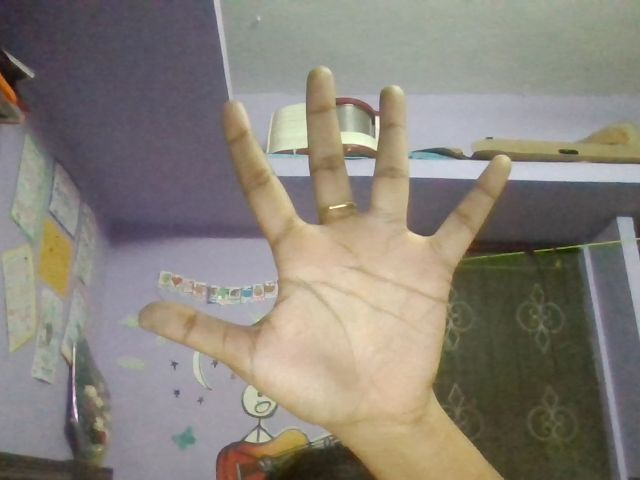

Capture authentication image 4/5


<IPython.core.display.Javascript object>

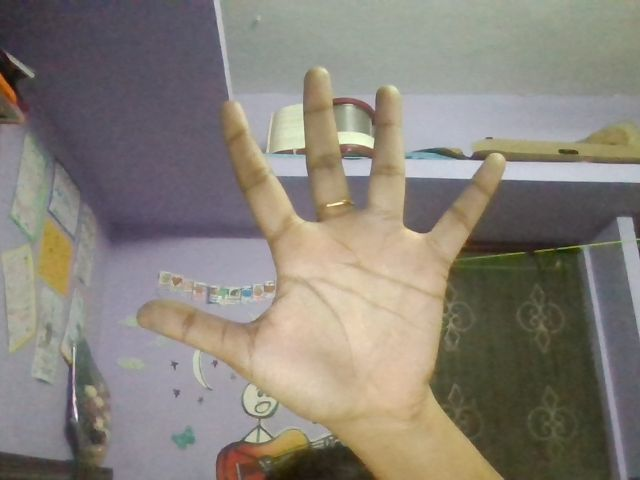

Capture authentication image 5/5


<IPython.core.display.Javascript object>

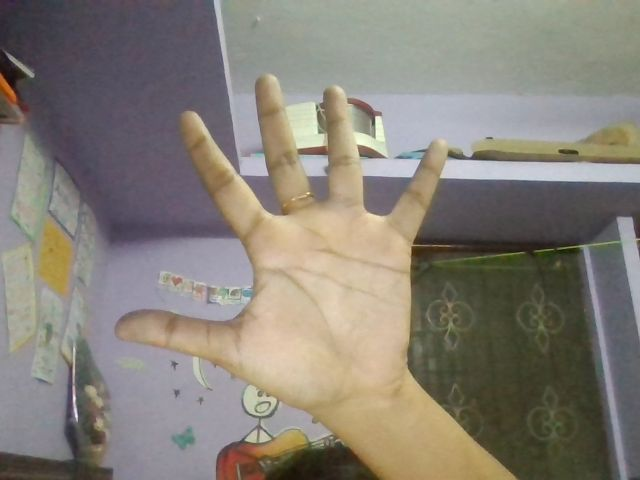

/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


✅ User 'Harini' enrolled with 5 hand images!

--- Capture gestures for classifier ---

Capture 2 samples for gesture: FIVE
Enter phrase for gesture 'FIVE' (or press Enter for default): 


<IPython.core.display.Javascript object>

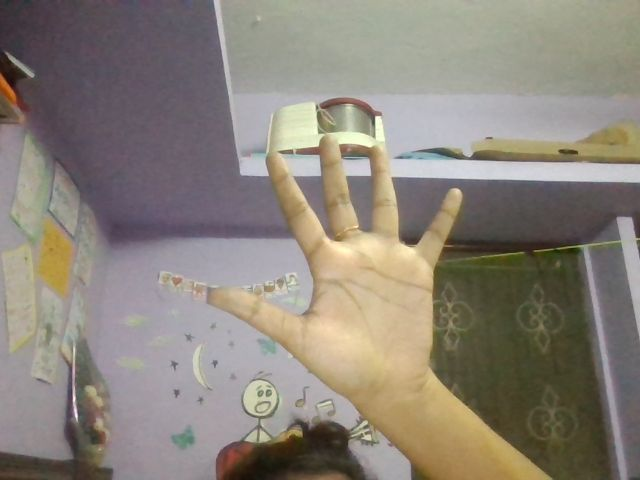

<IPython.core.display.Javascript object>

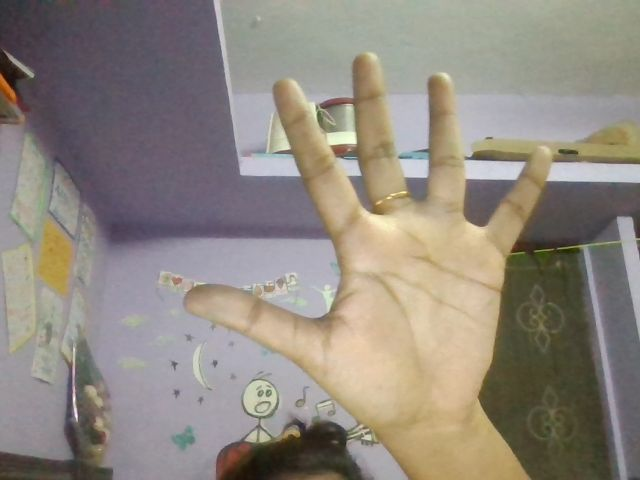


Capture 2 samples for gesture: PEACE
Enter phrase for gesture 'PEACE' (or press Enter for default): 


<IPython.core.display.Javascript object>

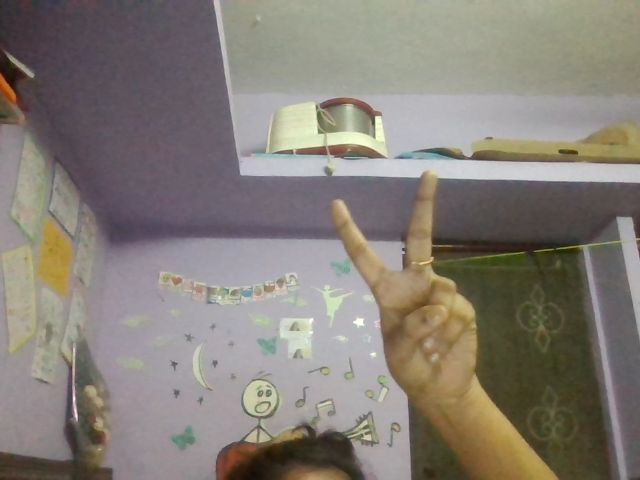

<IPython.core.display.Javascript object>

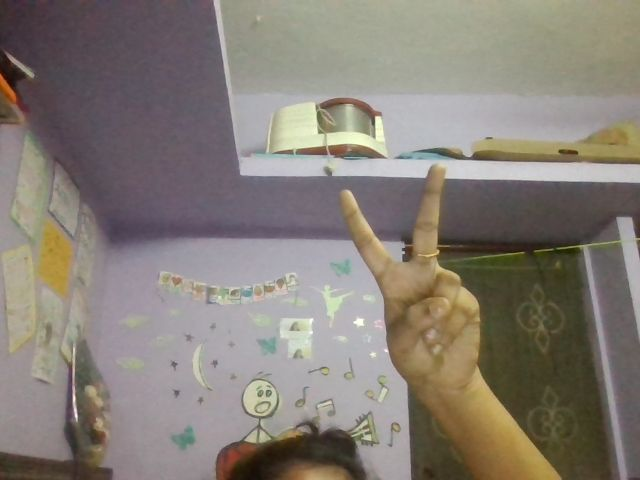


Capture 2 samples for gesture: THUMBS_UP
Enter phrase for gesture 'THUMBS_UP' (or press Enter for default): 


<IPython.core.display.Javascript object>

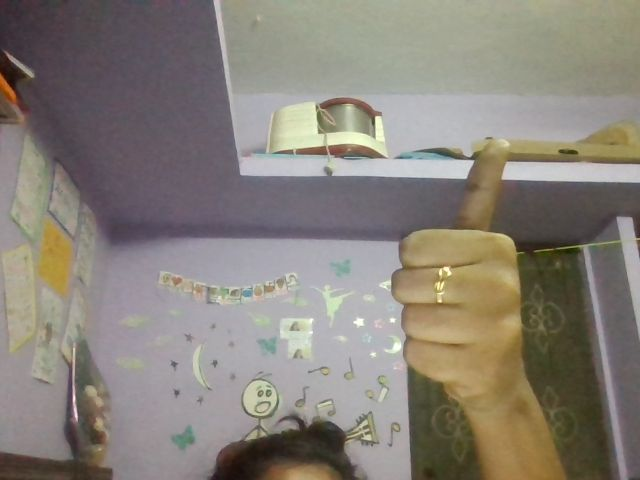

<IPython.core.display.Javascript object>

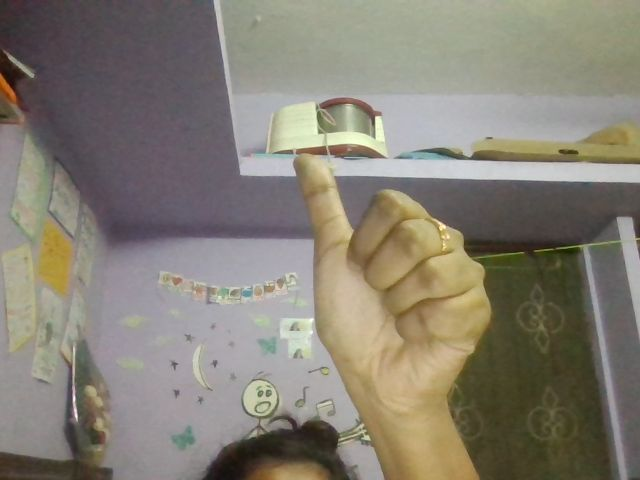


Capture 2 samples for gesture: THUMBS_DOWN
Enter phrase for gesture 'THUMBS_DOWN' (or press Enter for default): 


<IPython.core.display.Javascript object>

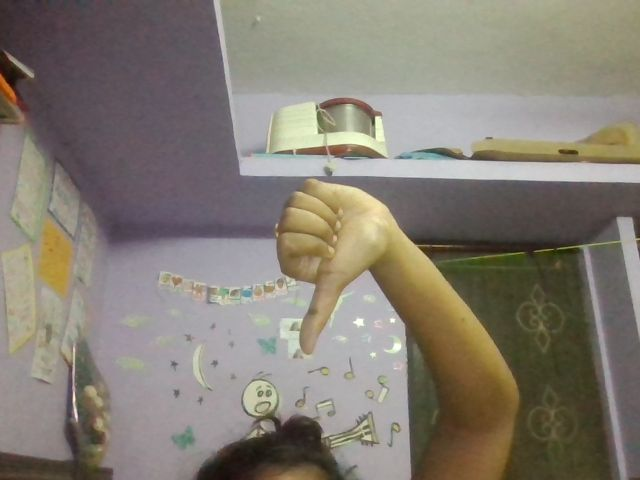

<IPython.core.display.Javascript object>

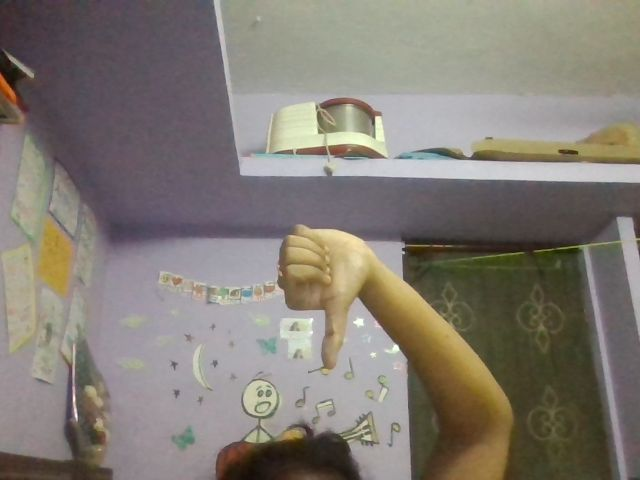


Capture 2 samples for gesture: FIST
Enter phrase for gesture 'FIST' (or press Enter for default): 


<IPython.core.display.Javascript object>

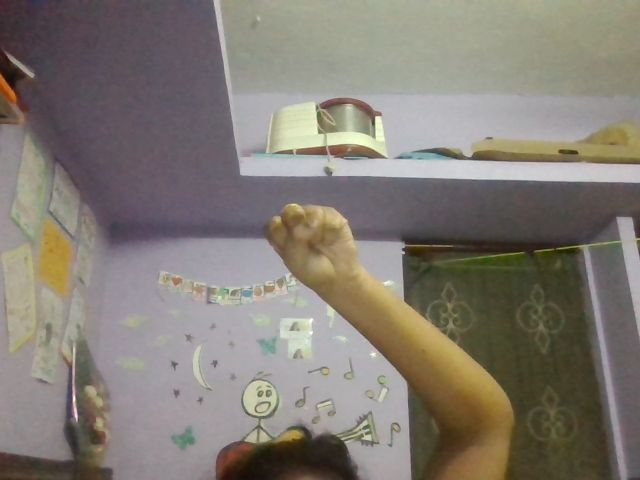

<IPython.core.display.Javascript object>

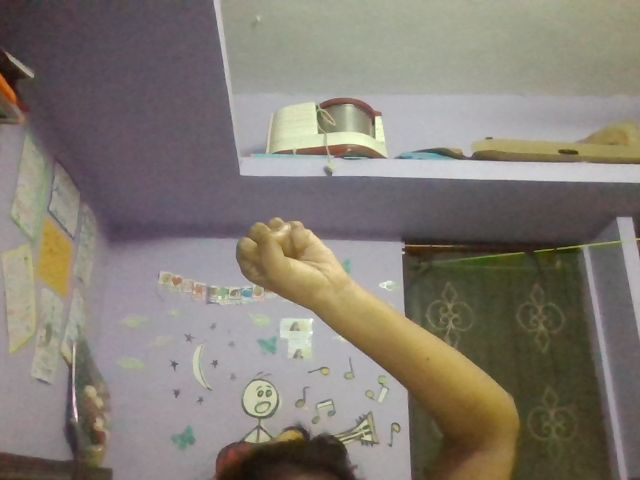


Capture 2 samples for gesture: CALL_ME
Enter phrase for gesture 'CALL_ME' (or press Enter for default): 


<IPython.core.display.Javascript object>

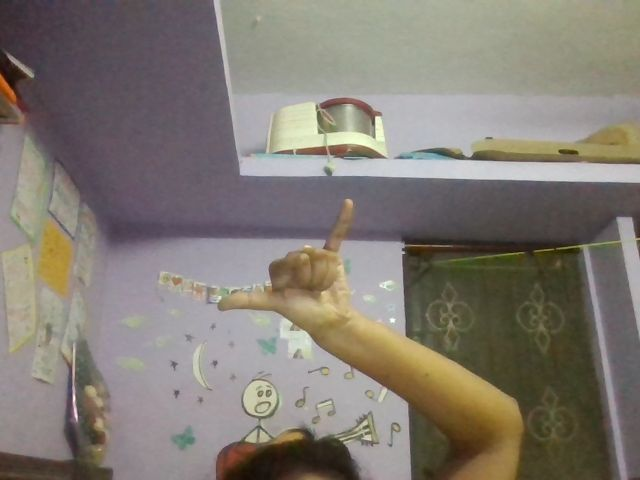

<IPython.core.display.Javascript object>

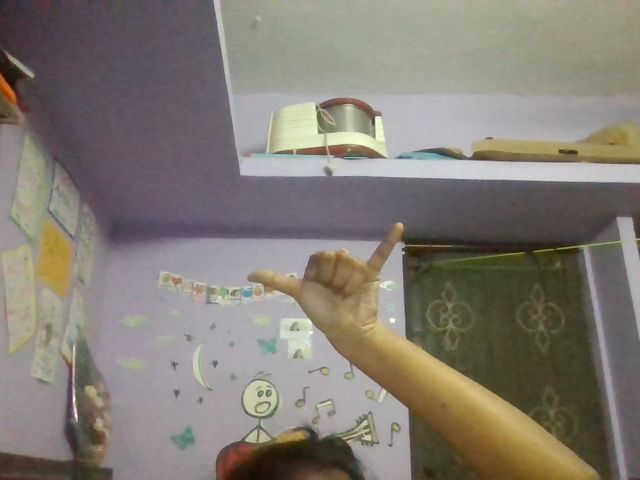


Capture 2 samples for gesture: ROCK
Enter phrase for gesture 'ROCK' (or press Enter for default): 


<IPython.core.display.Javascript object>

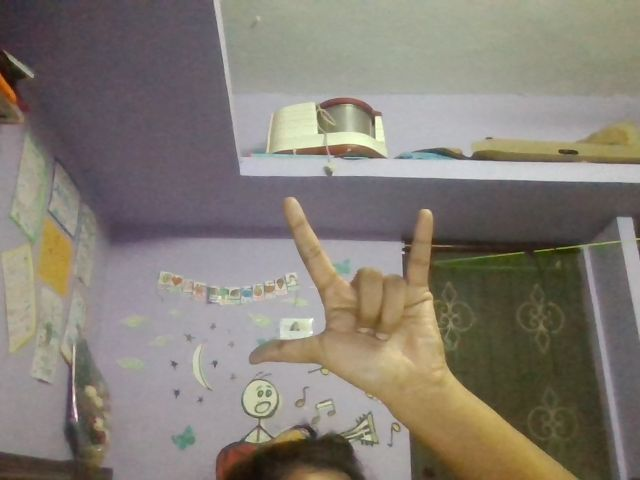

<IPython.core.display.Javascript object>

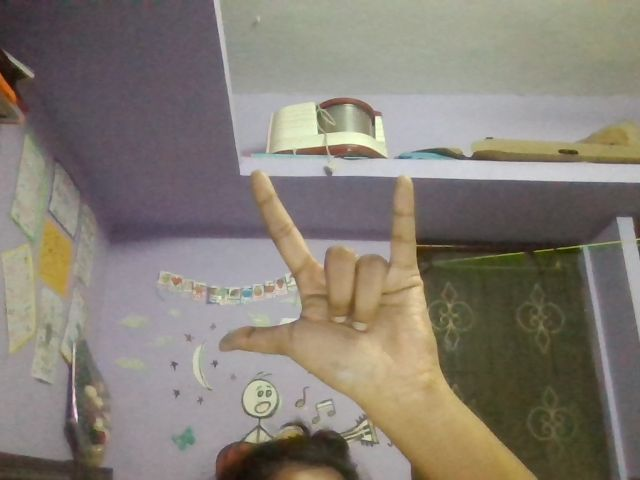


Capture 2 samples for gesture: OK
Enter phrase for gesture 'OK' (or press Enter for default): 


<IPython.core.display.Javascript object>

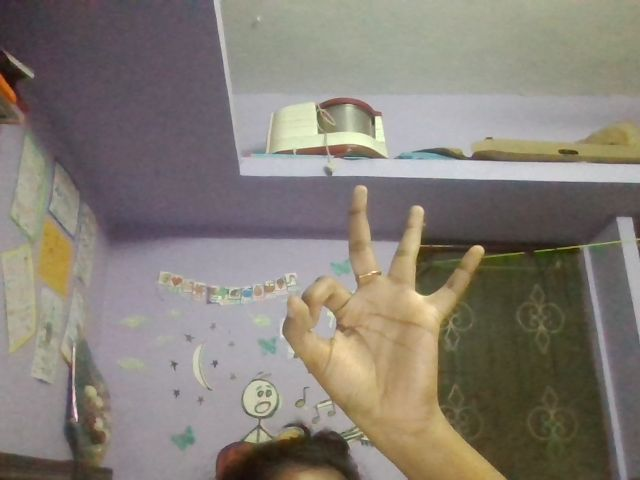

<IPython.core.display.Javascript object>

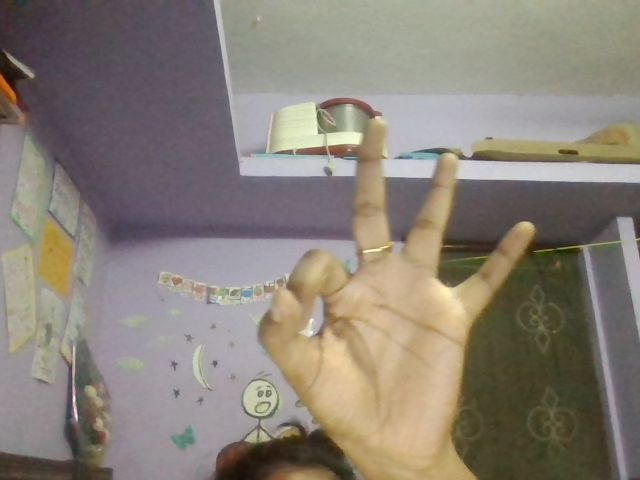

✅ Gesture classifier trained and saved!

Capture hand for authentication (Attempt 1/3):


<IPython.core.display.Javascript object>

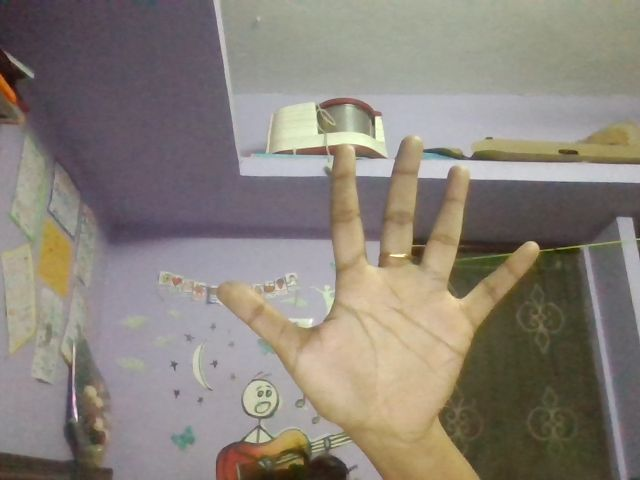

✅ Authenticated! Distance=0.273

Authenticated! Show gestures to camera.


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


<IPython.core.display.Javascript object>

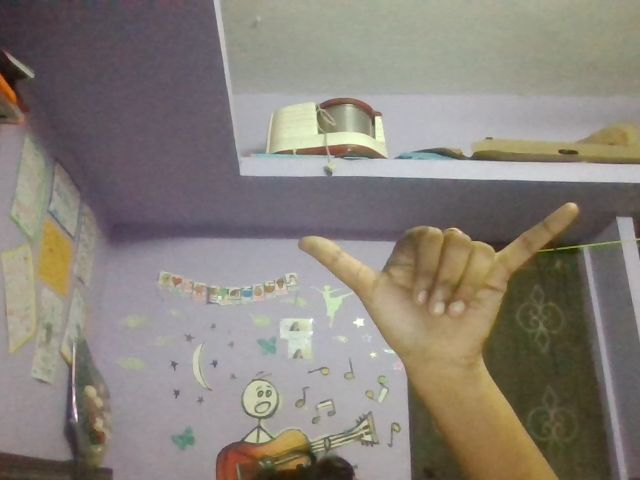

🎯 Gesture Detected: CALL_ME


In [ ]:
# --- Install dependencies ---
!pip install mediapipe opencv-python gTTS scikit-learn pandas

# --- Imports ---
import cv2
import mediapipe as mp
import numpy as np
import pickle, os
from gtts import gTTS
from IPython.display import Audio, display, Javascript
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import base64

# --- Paths ---
DB_PATH = "hand_user_db1.pkl"
CLASSIFIER_PATH = "gesture_classifier.pkl"
GESTURE_COMMANDS_PATH = "gesture_commands.pkl"

# --- Default gesture phrases ---
default_phrases = {
    "FIVE": "Hello! How are you?",
    "PEACE": "Thank you!",
    "THUMBS_UP": "Yes, I understand.",
    "THUMBS_DOWN": "No, please repeat.",
    "FIST": "Goodbye!",
    "CALL_ME": "Call someone for help!",
    "ROCK": "Let's go!",
    "OK": "Everything is fine."
}

# --- Load or create hand user database ---
if os.path.exists(DB_PATH):
    with open(DB_PATH, "rb") as f:
        user_db = pickle.load(f)
    print("User database loaded. Registered users:", list(user_db.keys()))
else:
    user_db = {}
    print("No user database found. Starting fresh.")

# --- Load or initialize gesture commands ---
if os.path.exists(GESTURE_COMMANDS_PATH):
    with open(GESTURE_COMMANDS_PATH, "rb") as f:
        gesture_commands = pickle.load(f)
else:
    gesture_commands = default_phrases.copy()

# --- MediaPipe setup ---
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1)

# --- Helper functions ---
def take_photo():
    display(Javascript('''
    async function takePhoto() {
      const video = document.createElement('video');
      video.width = 640; video.height = 480;
      const stream = await navigator.mediaDevices.getUserMedia({video:true});
      document.body.appendChild(video);
      video.srcObject = stream;
      await video.play();
      const button = document.createElement('button');
      button.textContent = 'Capture';
      document.body.appendChild(button);
      await new Promise(resolve => button.onclick = resolve);
      const canvas = document.createElement('canvas');
      canvas.width = 640; canvas.height = 480;
      canvas.getContext('2d').drawImage(video,0,0,640,480);
      const data = canvas.toDataURL('image/jpeg', 0.8);
      stream.getTracks().forEach(track => track.stop());
      video.remove(); button.remove();
      return data;
    }
    '''))
    data = eval_js("takePhoto()")
    img_bytes = base64.b64decode(data.split(',')[1])
    arr = np.frombuffer(img_bytes, dtype=np.uint8)
    return cv2.imdecode(arr, cv2.IMREAD_COLOR)

def extract_hand_landmarks(frame):
    """Return normalized 42-dim hand landmarks"""
    results = hands.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    if not results.multi_hand_landmarks:
        return None
    lm = results.multi_hand_landmarks[0]
    points = [(l.x, l.y) for l in lm.landmark]
    points = np.array(points)
    center = np.mean(points, axis=0)
    points -= center
    norm = np.linalg.norm(points)
    if norm > 0:
        points /= norm
    return points.flatten()

def enroll_user(username, frames):
    embeddings = []
    for frame in frames:
        emb = extract_hand_landmarks(frame)
        if emb is not None:
            embeddings.append(emb)
    if embeddings:
        if username in user_db:
            user_db[username].extend(embeddings)
        else:
            user_db[username] = embeddings
        with open(DB_PATH, "wb") as f:
            pickle.dump(user_db, f)
        print(f"✅ User '{username}' enrolled with {len(embeddings)} hand images!")
    else:
        print("❌ No hands detected.")

def authenticate_user(username, frame, threshold=0.4):
    """Threshold relaxed for real-world variations"""
    if username not in user_db:
        print("⚠️ User not enrolled.")
        return False
    emb = extract_hand_landmarks(frame)
    if emb is None:
        print("❌ No hand detected.")
        return False
    distances = [np.linalg.norm(emb - e) for e in user_db[username]]
    best_dist = min(distances)
    if best_dist < threshold:
        print(f"✅ Authenticated! Distance={best_dist:.3f}")
        return True
    else:
        print(f"❌ Authentication failed. Best distance={best_dist:.3f}")
        return False

def speak(text):
    if text:
        tts = gTTS(text)
        tts.save("output.mp3")
        display(Audio("output.mp3", autoplay=True))

# --- Workflow ---
username = input("Enter your name for enrollment/authentication: ")

# ----- Enrollment -----
if username not in user_db:
    # Capture multiple authentication images
    num_auth_images = 5
    auth_frames = []
    for i in range(num_auth_images):
        print(f"Capture authentication image {i+1}/{num_auth_images}")
        frame = take_photo()
        cv2_imshow(frame)
        auth_frames.append(frame)
    enroll_user(username, auth_frames)

    # Capture gestures
    gestures = list(default_phrases.keys())
    gesture_data = []
    num_samples = 2  # minimal per gesture
    print("\n--- Capture gestures for classifier ---")
    for gesture in gestures:
        print(f"\nCapture {num_samples} samples for gesture: {gesture}")
        # Ask user for command to be spoken
        user_command = input(f"Enter phrase for gesture '{gesture}' (or press Enter for default): ")
        if user_command.strip() != "":
            gesture_commands[gesture] = user_command
        for _ in range(num_samples):
            frame = take_photo()
            cv2_imshow(frame)
            emb = extract_hand_landmarks(frame)
            if emb is not None:
                gesture_data.append([gesture] + list(emb))
    # Train classifier
    df = pd.DataFrame(gesture_data)
    X = df.iloc[:,1:].values
    y = df.iloc[:,0].values
    clf = RandomForestClassifier(n_estimators=100)
    clf.fit(X, y)
    with open(CLASSIFIER_PATH, "wb") as f:
        pickle.dump(clf, f)
    # Save gesture commands
    with open(GESTURE_COMMANDS_PATH, "wb") as f:
        pickle.dump(gesture_commands, f)
    print("✅ Gesture classifier trained and saved!")

# ----- Authentication -----
attempts = 0
max_attempts = 3
authenticated = False

while attempts < max_attempts and not authenticated:
    print(f"\nCapture hand for authentication (Attempt {attempts+1}/{max_attempts}):")
    frame = take_photo()
    cv2_imshow(frame)
    authenticated = authenticate_user(username, frame)
    if not authenticated:
        attempts += 1
        if attempts < max_attempts:
            print("❌ Try again.")
        else:
            print("❌ Maximum authentication attempts reached. Exiting.")

# ----- Gesture Recognition -----
if authenticated:
    print("\nAuthenticated! Show gestures to camera.")
    # Load classifier and gesture commands safely
    if os.path.exists(CLASSIFIER_PATH):
        with open(CLASSIFIER_PATH, "rb") as f:
            clf = pickle.load(f)
    else:
        print("❌ Gesture classifier not found. Exiting.")
        exit()

    if os.path.exists(GESTURE_COMMANDS_PATH):
        with open(GESTURE_COMMANDS_PATH, "rb") as f:
            gesture_commands = pickle.load(f)
    else:
        gesture_commands = default_phrases.copy()

    gestures = list(gesture_commands.keys())
    gesture = None
    while gesture is None:
        frame = take_photo()
        cv2_imshow(frame)
        emb = extract_hand_landmarks(frame)
        if emb is not None:
            pred = clf.predict([emb])[0]
            if pred in gestures:
                gesture = pred
        if gesture is None:
            print("❌ No recognizable gesture detected. Try again.")

    print(f"🎯 Gesture Detected: {gesture}")
    speak(gesture_commands[gesture])
